<a href="https://colab.research.google.com/github/elhamadjidi/ML_tutorial/blob/main/Neural_Net_tutorial_main.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Overview of what happens in deep learning network**

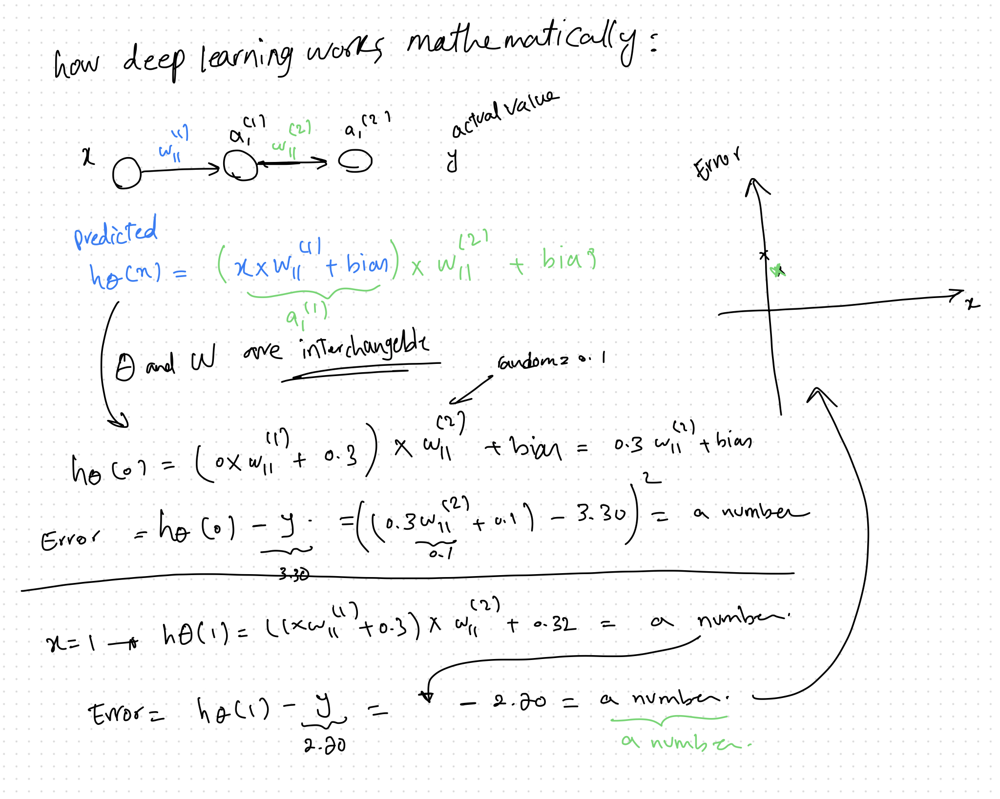

# **How to impelement a deep learning network - step by step**

# **Initialze the network (setting weights)**

neural networks for only one hidden layer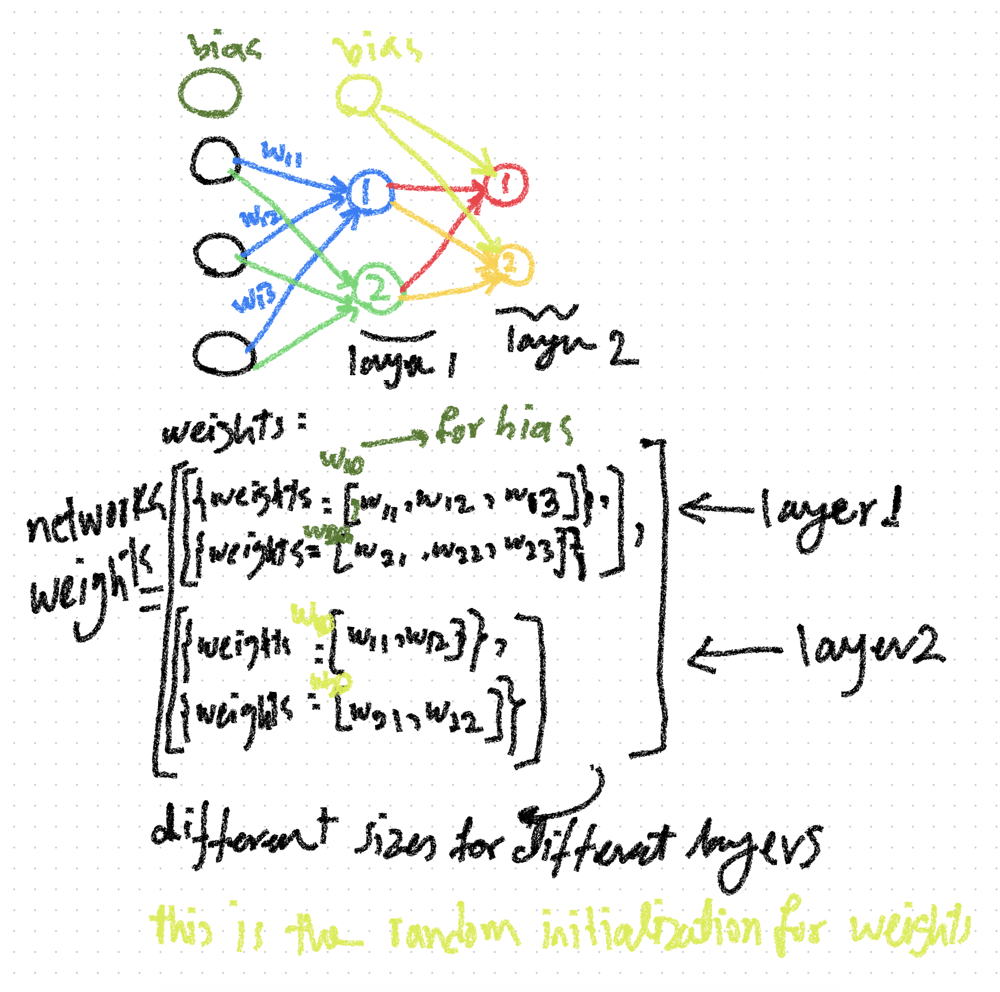

In [ ]:
from random import seed
from random import random

# Initialize a network
def initialize_network(n_inputs, n_hidden, n_outputs):
	network = []
	hidden_layer = [{'weights':[random() for i in range(n_inputs + 1)]} for i in range(n_hidden)]
	network.append(hidden_layer)
	output_layer = [{'weights':[random() for i in range(n_hidden + 1)]} for i in range(n_outputs)]
	network.append(output_layer)
	return network

seed(1)

# network=initialize_network(2, 1, 2)
# network[1]

Implementing neural networks to accommodate an arbitrary number of layers and nodes.

In [ ]:
from random import seed
from random import random

def initialize_network(network_lis):
  seed(1)
  networks = []
  for i in range(len(network_lis)-1):
    hidden_layer = [{'weights':[random() for j in range(network_lis[i]+1)]} for j in range(network_lis[i+1])]
    networks.append(hidden_layer)
  return networks

initialize_network([2,3,2,5]) # for istance this is a networks with 2 hidden layers each have 3 and 2 nodes. the input layer has 2 nodes and output has f nodes.


[[{'weights': [0.13436424411240122, 0.8474337369372327, 0.763774618976614]},
  {'weights': [0.2550690257394217, 0.49543508709194095, 0.4494910647887381]},
  {'weights': [0.651592972722763, 0.7887233511355132, 0.0938595867742349]}],
 [{'weights': [0.02834747652200631,
    0.8357651039198697,
    0.43276706790505337,
    0.762280082457942]},
  {'weights': [0.0021060533511106927,
    0.4453871940548014,
    0.7215400323407826,
    0.22876222127045265]}],
 [{'weights': [0.9452706955539223, 0.9014274576114836, 0.030589983033553536]},
  {'weights': [0.0254458609934608, 0.5414124727934966, 0.9391491627785106]},
  {'weights': [0.38120423768821243, 0.21659939713061338, 0.4221165755827173]},
  {'weights': [0.029040787574867943,
    0.22169166627303505,
    0.43788759365057206]},
  {'weights': [0.49581224138185065, 0.23308445025757263, 0.2308665415409843]}]]

# **FeedForward**


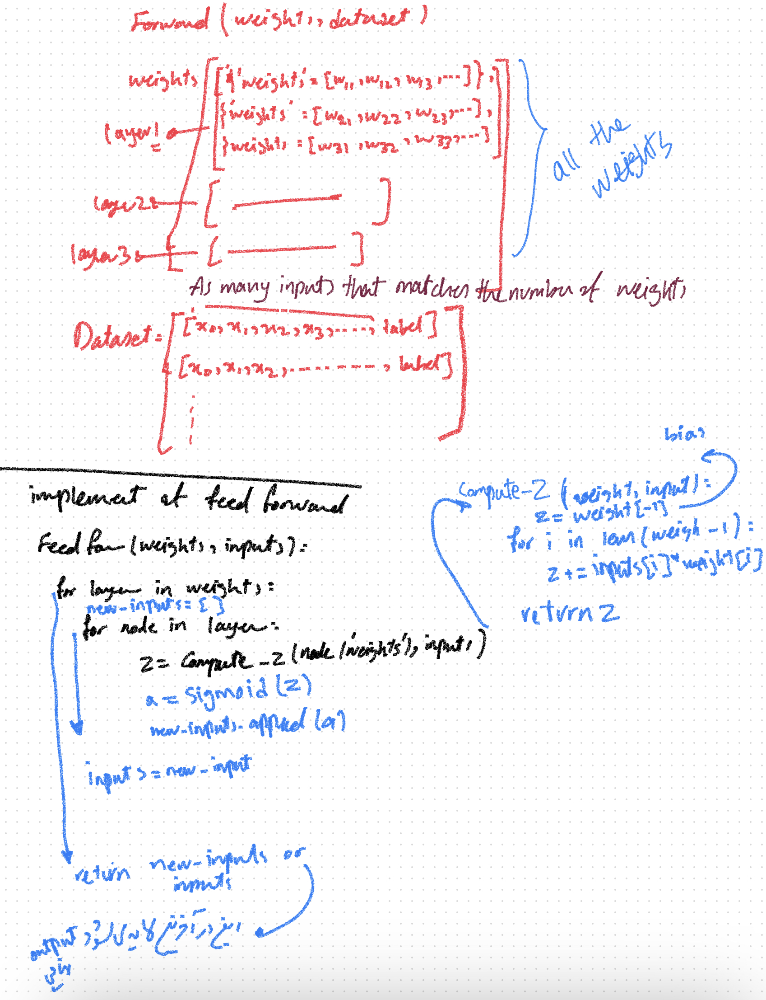

In [ ]:
from math import exp

def compute_z(weights, inputs):
  z = weights[-1] #bias
  for i in range(len(weights)-1):
    z+= inputs[i] * weights[i] #z= sum(x_i * weight_i) + bias
  return z

def sigmoid(z):
  return 1.0 / (1.0 + exp(-z))

def feedforward(weights, inputs):
  for layer in weights: #go through each row of weights matrix which is the weights of each layer
    # print('****')
    # print(layer)
    # print('****')
    new_inputs = [] #the output of each layer is the input for next layer
    for node in layer:
      z = compute_z(node['weights'], inputs) #based on the weight and input we want to compute the z
      a = sigmoid(z)
      node['output'] = a #now each neurons has the output value
      new_inputs.append(a) #new_inputs = [a_0, a_1, a_2,...] for each layer
    inputs = new_inputs
  return inputs #the last layer input is the networks prediction

In [ ]:
# test forward propagation
network = [[{'weights': [0.13436424411240122, 0.8474337369372327, 0.763774618976614]}],
 [{'weights': [0.2550690257394217, 0.49543508709194095]}, {'weights': [0.4494910647887381, 0.651592972722763]}]]
row = [1, 0, None]
output = feedforward(network, row)
print(output)

****
[{'weights': [0.13436424411240122, 0.8474337369372327, 0.763774618976614]}]
****
****
[{'weights': [0.2550690257394217, 0.49543508709194095]}, {'weights': [0.4494910647887381, 0.651592972722763]}]
****
[0.6629970129852887, 0.7253160725279748]


# **BackPropagation**

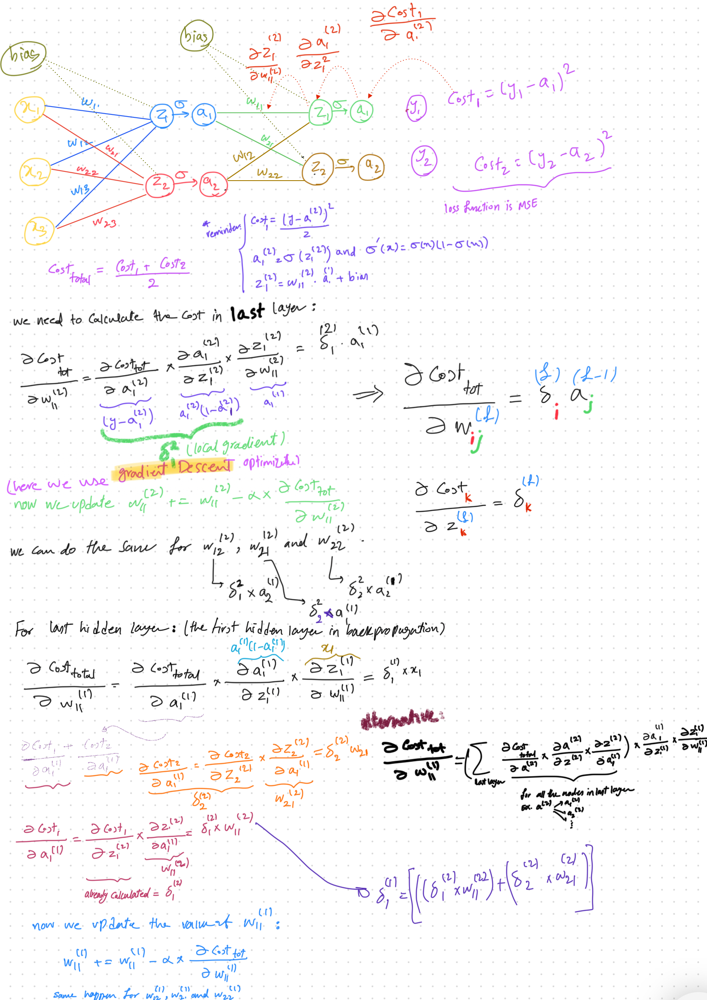

There are several loss functions used in machine learning and neural network training, each suitable for different types of problems and data distributions. Here are some common loss functions:


*       Mean Squared Error (MSE):

        Suitable for regression problems.
        Measures the average of the squares of the errors or deviations, which is the difference between the predicted and actual values.
*   Binary Cross-Entropy / Log Loss:  $LogLoss = - \frac{1}{n} \sum_{i=1}^{n} [y_{i} \log(\hat{y}_{i}) + (1 - y_{i}) \log(1 - \hat{y}_{i})]$

   Used for binary classification problems.
Measures the difference between two probability distributions (predicted probabilities vs. actual outcomes).
Suitable when the output is a probability value between 0 and 1.


*   Categorical Cross-Entropy:     
  Used for multi-class classification problems.
Similar to binary cross-entropy but extended to handle multiple classes.
Measures the difference between predicted class probabilities and true class labels.
*   Sparse Categorical Cross-Entropy:
Similar to categorical cross-entropy but used when the target labels are integers instead of one-hot encoded vectors.
Useful when dealing with large datasets with many classes.


*   Hinge Loss:

  Used for binary classification, particularly in Support Vector Machines (SVMs) and linear classifiers.
  Maximizes the margin between classes, encouraging correct classification with a margin.
*   Huber Loss:

  Used in regression tasks, particularly robust regression where outliers may be present.
  Combines the best properties of MSE (quadratic loss) and Mean Absolute Error (MAE, linear loss).


*   Kullback-Leibler Divergence (KL Divergence):

  Measures how one probability distribution diverges from a second, expected probability distribution.
  Often used in probabilistic models for comparing probability distributions.
*   Dice Loss:
  Commonly used in image segmentation tasks.
  Measures the overlap between predicted and ground truth segmentation masks.


*   Mean Absolute Error (MAE):

  Another loss function used in regression tasks.
  Measures the average absolute differences between predicted and actual values.
*   Cosine Similarity Loss:
  Measures the cosine similarity between predicted and target vectors.
  Often used in recommendation systems and information retrieval tasks.




    


   


    


    


In [ ]:
def backpropagation(network, expected,le):
  for i in reversed(range(len(network))): #1,0

    layer = network[i]
    errors = [] #to hold local gradient for each layer

    if i == len(network) - 1: #for the last layer
      for j in range(len(layer)): #to go throgh each neuron in this layer
        node = layer[j]
        errors.append(node['output'] - expected[j]) # a portion of delta is calculated
    else: #for all hidden layers
      error = 0.0
      for j in range(len(layer)):
        for node in network[i+1]: #neuron in the next layer
          error += (node['weights'][j] * node['delta']) # a portion of delta is calculated neuron['weight'][0] * neuron['delta']
        errors.append(error)

    for j in range(len(layer)):  #ragardless of layer we need to calculate the detla
     node = layer[j]
     a = node['output']
     node['delta'] = errors[j] * (a*(1-a))

# **Update weights and training**

**Optimization algorithm used to minimize a function (like a loss function)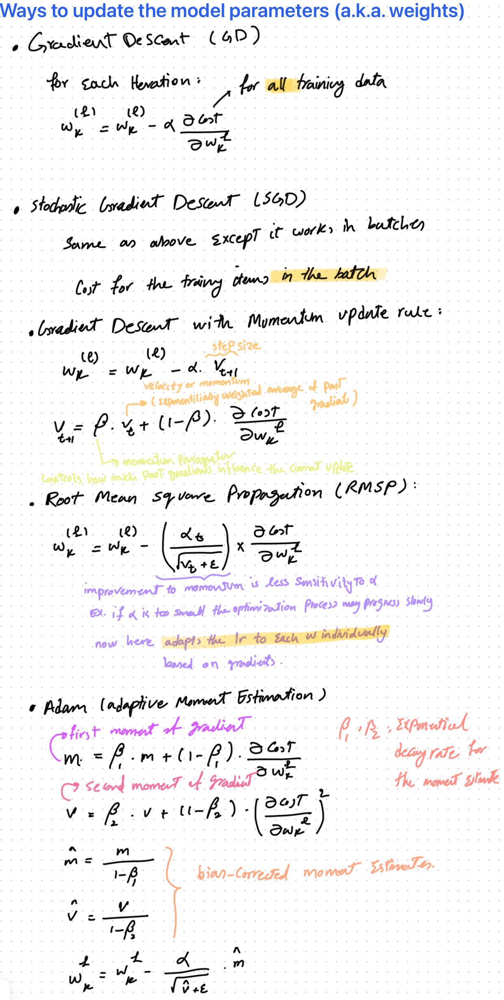**


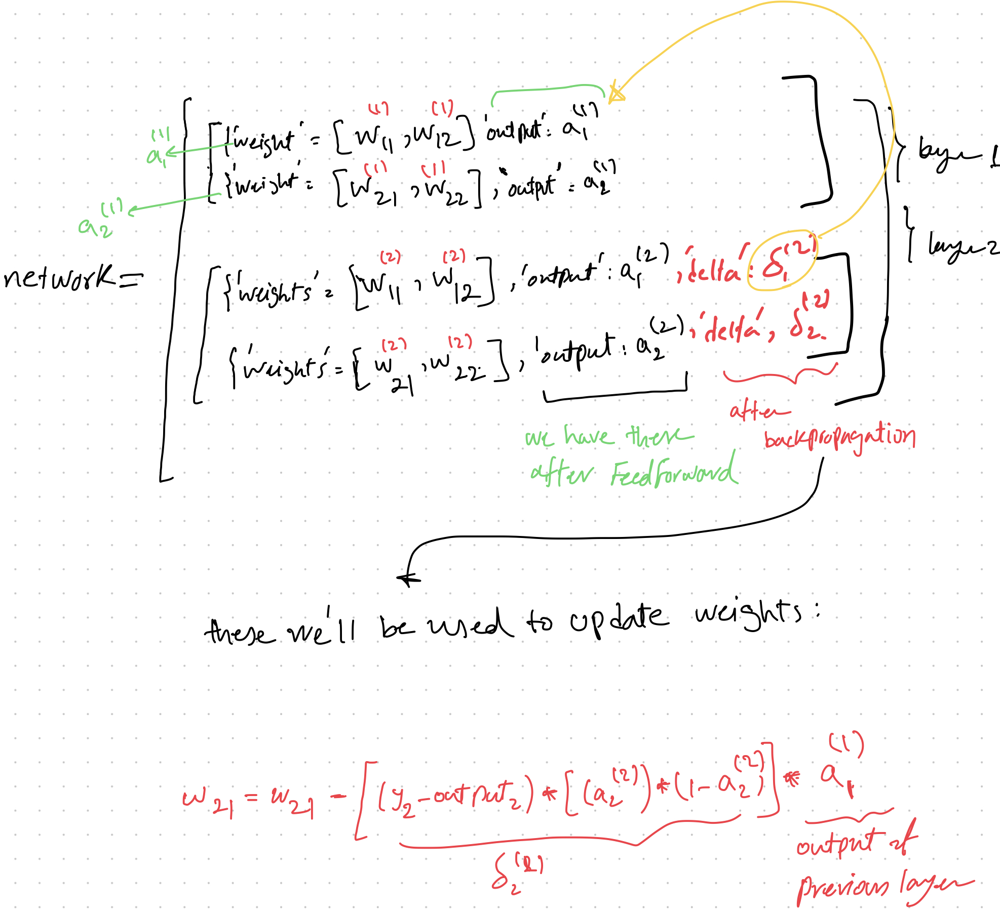

In [ ]:
#this approach is not optimized since it calculate the cost for each row instead of vectorised approach (cost for all the rows/ number of rows)
#it also doesnt update the weights by the average of costs with respect to that weight for all the input items





def update_weights(network, input, le):
  for i in range(len(network)):
    if i !=0: # except for first layer, every layer uses its previous layer output
       input = [neuron['output'] for neuron in network[i-1]]

    for node in network[i]: #going through every node in this layer
      for j in range(len(input)):
        node['weights'][j] -= le * node['delta']* input[j] #updating all the wights
      node['weights'][-1] -= le * node['delta']  #updating all the biases

def train_network(network, dataset, unique_labels, learning_rate, epoch):
  encoding = {}
  for i, label in enumerate(unique_labels): #making a hash tabel for each label -> {'1': [1,0,0],'2': [0,1,0]}
      one_hot_vector = [0] * len(unique_labels)
      one_hot_vector[i] = 1 # for each label change the expected vector ex. for label 1 the expected will be [0,1] and for the label 0 expected = [1,0]
      encoding[label] = one_hot_vector
  for epoch in range(epoch):
    cost = 0.0
    for row in dataset:
      output = feedforward(network, row) #produces the output in the feedforward for instance [0.6792885329144388, 0.7504631664645315]
      target = encoding[row[-1]]
      # print(f'row is {row}')
      # print(f'unique labels is {unique_labels}')
      # print(f'output is {output}')
      # print(f'target is {target}')
      cost += sum([(target[i]- output[i])**2 for i in range(len(output))]) #calculated the error for this row
      backpropagation(network, target,learning_rate )
      update_weights(network, row[:-1], learning_rate)
    print('>epoch=%d, lrate=%.3f, error=%.3f' % (epoch, learning_rate, cost))
# from random import seed
# seed(1)
# dataset = [[2.7810836,2.550537003,0],
#  [1.465489372,2.362125076,0],
#  [3.396561688,4.400293529,0],
#  [1.38807019,1.850220317,0],
#  [3.06407232,3.005305973,0],
#  [7.627531214,2.759262235,1],
#  [5.332441248,2.088626775,1],
#  [6.922596716,1.77106367,1],
#  [8.675418651,-0.242068655,1],
#  [7.673756466,3.508563011,1]]
# num_inputs = len(dataset[0])-1
# num_outputs = len(set([row[-1] for row in dataset]))
# network = initialize_network(num_inputs, 2, num_outputs)
# train = train_network(network = network, dataset = dataset, n_outputs = num_outputs, learning_rate = 0.5, epoch = 20)

# **Predict**

In [ ]:
def predict(network,data): #this data doesnt have the label only inputs
  outputs = feedforward(network, data) #produces the output in the feedforward for instance [0.6792885329144388, 0.7504631664645315]
  return outputs.index(max(outputs)) #finds the max in the output and report the index of that as for the label
  # predict (network, [7.673756466,3.508563011,1]) #test the predict

In [ ]:
dataset = [[2.7810836,2.550537003,0],
 [1.465489372,2.362125076,0],
 [3.396561688,4.400293529,0],
 [1.38807019,1.850220317,0],
 [3.06407232,3.005305973,0],
 [7.627531214,2.759262235,1],
 [5.332441248,2.088626775,1],
 [6.922596716,1.77106367,1],
 [8.675418651,-0.242068655,1],
 [7.673756466,3.508563011,1]]
network = [[{'weights': [-1.482313569067226, 1.8308790073202204, 1.078381922048799]}, {'weights': [0.23244990332399884, 0.3621998343835864, 0.40289821191094327]}],
 [{'weights': [2.5001872433501404, 0.7887233511355132, -1.1026649757805829]}, {'weights': [-2.429350576245497, 0.8357651039198697, 1.0699217181280656]}]]
for row in dataset:
 prediction = predict(network, row)
 print('Expected=%d, Got=%d' % (row[-1], prediction))

Expected=0, Got=0
Expected=0, Got=0
Expected=0, Got=0
Expected=0, Got=0
Expected=0, Got=0
Expected=1, Got=1
Expected=1, Got=1
Expected=1, Got=1
Expected=1, Got=1
Expected=1, Got=1


# **Real word example**

Load and preprocessing of the dataset. Preprocessing inclused type conversion and normalization.

Formula for normalization: $X_{\text{normalized}} = \frac{X - \text{min}(X)}{\text{max}(X) - \text{min}(X)}
$



In [ ]:
import csv
def load_data(file_path):
  dataset = []
  with open(file_path) as f:
    reader = csv.reader(f)
    for row in reader:
      dataset.append(row)
  return dataset

dataset = load_data('/content/wheat-seeds.csv')
print(type(dataset[0][0])) #<class 'str'>
print(type(dataset[0][-1])) #<class 'str'>

#we need to convert the types for inputs to float and the label to int
def dataset_convert(dataset):
  for row in dataset:
    row[:-1] = [float(item) for item in row[:-1]]
    row[-1] = int(row[-1])


dataset_convert(dataset)
print(type(dataset[0][0])) #<class 'float'>
print(type(dataset[0][-1])) #<class 'int'>

# print a row of the dataset before normalization
print(dataset[0]) #[15.26, 14.84, 0.871, 5.763, 3.312, 2.221, 5.22, 1]


#we can normalize the data -> x_normalized = x - min(all x)/ max(all x) - min(all x)
def dataset_normalize(dataset):
  columns_data = list(map(list, zip(*dataset))) #now each row of this is all the columns data, *dataset is transpose of the dataset -> size = 8*210
  for i in range(len(columns_data)-1):
    min_1 = min(columns_data[i]) #min of all values in one colum ->min(all x)
    max_1 = max(columns_data[i]) #mmax of all values in one colum ->max(all x)
    for j in range(len(columns_data[i])): #go through each item in the colum and normalize it
      columns_data[i][j] = (columns_data[i][j] - min_1)/ (max_1 - min_1)
  normalized_adataset = list(map(list, zip(*columns_data)))  #transpose the data back
  return normalized_adataset #now return this new dataset, being the normalized version of the input dataset

dataset = dataset_normalize(dataset) #update the dataset to normalized version
print(dataset[0]) #[0.4409820585457979, 0.5020661157024793, 0.570780399274047, 0.48648648648648646, 0.48610121168923714, 0.18930164220052273, 0.3451501723289019, 1]



<class 'str'>
<class 'str'>
<class 'float'>
<class 'int'>
[15.26, 14.84, 0.871, 5.763, 3.312, 2.221, 5.22, 1]
[0.4409820585457979, 0.5020661157024793, 0.570780399274047, 0.48648648648648646, 0.48610121168923714, 0.18930164220052273, 0.3451501723289019, 1]


**Prepare for training**: step1 : kfold cross validation

In [ ]:
from random import shuffle
def cross_validation(dataset, k_fold):
    num_samples = len(dataset)
    fold_size = num_samples // k_fold
    shuffle(dataset)  # for adding randomness

    folds = [dataset[i:i + fold_size] for i in range(0, num_samples, fold_size)]  # Split dataset into folds
    train_data = []
    test_data = []

    for i in range(k_fold):
        test_data.append(folds[i]) #dataset[0:70] and dataset[70:140] and dataset[140:210]
        train_data_fold = [sample for j, fold in enumerate(folds) if j != i for sample in fold] # dataset[70:210] and dataset[0:70]dataset[140:210] and dataset[0:70]dataset[70:210]
        train_data.append(train_data_fold)

    return train_data, test_data


**Evaluation of the model:** Using accuracy

Accuracy = (true negative + true positive)/number of samples

In [ ]:
def accuracy(predict_lis, test_labels_lis): #give the function what we wanted and what we calculated, each a list of all predictions and labels
  correct_matches = 0

  # Iterate through both lists simultaneously
  for pred, label in zip(predict_lis, test_labels_lis):
      # print(f'Predict  {type(pred)}')
      # print(f'label  {type(label)}')
      if pred == label:  # If the predicted value matches the label
          correct_matches += 1  # Increment the counter

  print("Correct Matches:", correct_matches)
  print("length:", len(test_labels_lis))
  return (correct_matches / len(test_labels_lis)) * 100.0

def evaluate(dataset, network, labels,k_folds, learning_rate , epoch):
  scores = []
  for i in range(k_folds):
    train, test = cross_validation(dataset,k_folds)
    train = train_network(network = network, dataset = train[i], unique_labels = labels, learning_rate = 0.5, epoch = epoch)
    predicts = [predict(network, row) for row in test[i]] #[0,0,0,1,3,2,....]
    # print(f'Predict{predicts}')
    test_labels = [row[-1] for row in test[i]]
    # print(f'test_labels{test_labels}')
    scores.append(accuracy(test_labels, predicts))
  return scores

In [ ]:
num_hidden = 5  #number
num_inputs = len(dataset[0])-1  # inputs of the model which is our features/labels/columns
# print((set([row[-1] for row in dataset])))
unique_labels = list(set([row[-1] for row in dataset]))
num_outputs = len(unique_labels)
# print(num_outputs)
network = initialize_network(num_inputs, 5, num_outputs)
scores = evaluate(dataset, network, unique_labels ,k_folds = 3, learning_rate = 0.5, epoch = 20)
mean_acc = (sum(scores)/len(scores) )*100

In [ ]:
print(scores)
print(mean_acc)

[0.0, 0.0, 0.0, 0.0, 2.380952380952381]
47.61904761904761


# **All code in one block - tested and working**

Codes works fine, you can explore with differen layers and see how the gradient convergence changes.

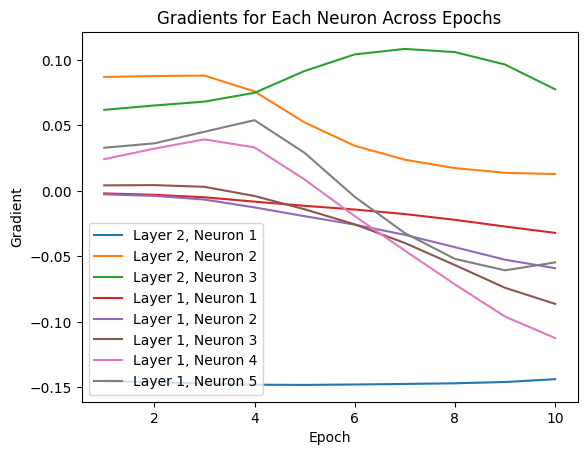

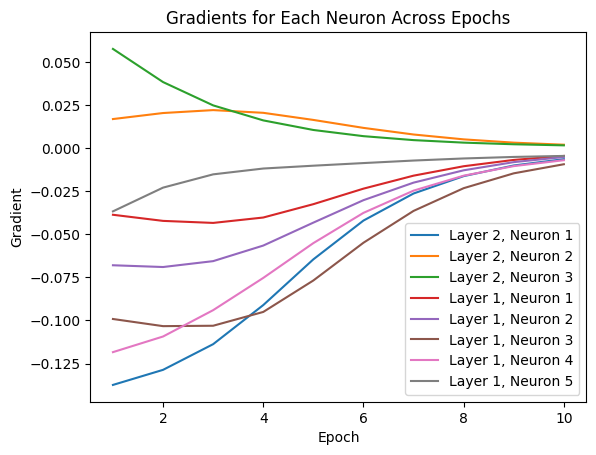

Scores: [85.71428571428571, 90.47619047619048]
Mean Accuracy: 88.095%


In [ ]:
# all
from random import random
from math import exp
import csv
from random import shuffle



def initialize_network(network_lis):
  # seed(1)
  networks = []
  for i in range(len(network_lis)-1):
    hidden_layer = [{'weights':[random() for j in range(network_lis[i]+1)]} for j in range(network_lis[i+1])]
    networks.append(hidden_layer)
  return networks

def compute_z(weights, inputs):
    z = weights[-1]  # bias
    for i in range(len(weights) - 1):
        z += inputs[i] * weights[i]  # z= sum(x_i * weight_i) + bias
    return z


def sigmoid(z):
    return 1.0 / (1.0 + exp(-z))


def feedforward(weights, inputs):
    for layer in weights:  # go through each row of weights matrix which is the weights of each layer
        # print('****')
        # print(layer)
        # print('****')
        new_inputs = []  # the output of each layer is the input for next layer
        for node in layer:
            z = compute_z(node['weights'], inputs)  # based on the weight and input we want to compute the z
            a = sigmoid(z)
            node['output'] = a  # now each neurons has the output value
            new_inputs.append(a)  # new_inputs = [a_0, a_1, a_2,...] for each layer
        inputs = new_inputs
    return inputs  # the last layer input is the networks prediction


def backpropagation(network_weights, expected):
    gradients = [] # List to store gradients for each layer
    for i in reversed(range(len(network_weights))):  # 1,0

        layer = network_weights[i]
        errors = []  # to hold local gradient for each layer

        if i == len(network_weights) - 1:  # for the last layer
            for j in range(len(layer)):  # to go through each neuron in this layer
                node = layer[j]
                errors.append(node['output'] - expected[j])  # a portion of delta is calculated
        else:  # for all hidden layers
            error = 0.0
            for j in range(len(layer)):
                for node in network_weights[i + 1]:  # neuron in the next layer
                    error += (node['weights'][j] * node['delta'])  # a portion of delta is calculated neuron['weight'][0] * neuron['delta']
                errors.append(error)



        for j in range(len(layer)):  # regardless of layer(last of first) we need to calculate the delta
            node = layer[j]
            a = node['output']
            node['delta'] = errors[j] * (a * (1 - a))

        gradients.append([node['delta'] for node in layer])
    return gradients

def update_weights(network_weights, input_lis, le):
    for i in range(len(network_weights)):
        if i != 0:  # except for first layer, every layer uses its previous layer output
            input_lis = [neuron['output'] for neuron in network_weights[i - 1]]

        for node in network_weights[i]:  # going through every node in this layer
            for j in range(len(input_lis)):
                node['weights'][j] -= le * node['delta'] * input_lis[j]  # updating all the wights
            node['weights'][-1] -= le * node['delta']  # updating all the biases

import matplotlib.pyplot as plt
# with showing each hidden layer neuron
def plot_gradients_per_epoch(gradients_per_epoch):
    num_epochs = len(gradients_per_epoch)
    num_layers = len(gradients_per_epoch[0])

    for layer_idx in range(num_layers):
        corrected_layer_idx = num_layers - layer_idx
        for neuron_idx in range(len(gradients_per_epoch[0][layer_idx])):
            neuron_gradients = [epoch[layer_idx][neuron_idx] for epoch in gradients_per_epoch]
            plt.plot(range(1, num_epochs + 1), neuron_gradients, label=f'Layer {corrected_layer_idx}, Neuron {neuron_idx + 1}')

    plt.xlabel('Epoch')
    plt.ylabel('Gradient')
    plt.title('Gradients for Each Neuron Across Epochs')
    plt.legend()
    plt.show()


def train_network(network_lis, dataset_lis, labels_set, learning_rate, epoch):
    gradients_over_epochs = []  # List to store gradients for each epoch [[gradients of each node in last layer],[gradients of each node in the previous layer], ...[gradients of each node in tfirst hidden layer] ]
    for epoch in range(epoch):
        cost = 0.0
        for row in dataset_lis:
            output = feedforward(network_lis, row)  # produces the output in the feedforward for instance ex:[0.0012375593654343202, 0.002058024513524419, 0.9982519894389591]
            target = [0] * len(labels_set)  # [0,0,0]
            target[row[-1]] = 1  # if label is 2 then target vector:[0,0,1]
            cost += sum([(target[i] - output[i]) ** 2 for i in range(len(target))])  # calculated the error for this row
            gradients = backpropagation(network_lis, target)
            update_weights(network_lis, row[:-1], learning_rate)
        # print('>epoch=%d, lrate=%.3f, error=%.3f' % (epoch, learning_rate, cost)) #if you want to see changes in each epoch
        # print(f'gradient is {gradients} for epoch {epoch}')
        gradients_over_epochs.append(gradients)
    plot_gradients_per_epoch(gradients_over_epochs)


def predict(network_lis, data):  # this data doesnt have the label only inputs
    outputs = feedforward(network_lis, data)
    return outputs.index(max(outputs))  # finds the max in the output and report the index of that as for the label


def load_data(file_path):
    dataset_lis = []
    with open(file_path) as f:
        reader = csv.reader(f)
        for row in reader:
            dataset_lis.append(row)
    return dataset_lis


dataset = load_data('/content/wheat-seeds.csv')


# print(type(dataset[0][0]))  # <class 'str'>
# print(type(dataset[0][-1]))  # <class 'str'>

def label_convert(unique_labels_lis, label):  # for label conversion we use a lookup table ex {'1':0, '2':1, '3':2} -- label must start from 0
    lookup = {}
    for i, value in enumerate(unique_labels_lis):
        lookup[value] = i
    return lookup[label]


# we need to convert the types for inputs to float and the label to int starting at 0
def dataset_convert(dataset_lis):
    unique_labels = list(set([row[-1] for row in dataset]))
    for row in dataset_lis:
        row[:-1] = [float(item) for item in row[:-1]]
        row[-1] = label_convert(unique_labels, row[-1])


# print(f'dataset before convert {dataset[100]}')
dataset_convert(dataset)
# print(type(dataset[0][0]))  # <class 'float'>
# print(type(dataset[0][-1]))  # <class 'int'>
# print(f'dataset after convert {dataset[100]}')


# print a row of the dataset before normalization
# print(dataset[0])  # [15.26, 14.84, 0.871, 5.763, 3.312, 2.221, 5.22, 1]


def normalize_dataset(dataset):
    # Convert data types
    dataset_convert(dataset)

    # Get mins and maxes across entire dataset
    mins = [min(feature[:-1]) for feature in
            zip(*dataset)]  # mins of each column [10.59, 12.41, 0.8081, 4.899, 2.63, 0.7651, 4.519, 1]
    maxs = [max(feature[:-1]) for feature in
            zip(*dataset)]  # max of each column [21.18, 17.25, 0.9183, 6.675, 4.033, 8.456, 6.55, 3]

    for row in dataset:
        for j in range(len(row) - 1):
            row[j] = (row[j] - mins[j]) / (maxs[j] - mins[j])

    return dataset


dataset = normalize_dataset(dataset)  # update the dataset to normalized version
# print(dataset[0])  # [0.4409820585457979, 0.5020661157024793, 0.570780399274047, 0.48648648648648646,0.48610121168923714, 0.18930164220052273, 0.3451501723289019, 1]

# print(f'dataset after normalization {dataset[100]}')


def cross_validation(dataset_lis, k_fold):
    num_samples = len(dataset_lis)
    fold_size = num_samples // k_fold
    shuffle(dataset_lis)  # for adding randomness

    folds = [dataset_lis[i:i + fold_size] for i in range(0, num_samples, fold_size)]  # Split dataset into folds
    train_data = []
    test_data = []

    for i in range(k_fold):
        test_data.append(folds[i])  # [dataset[0:70] , dataset[70:140] , dataset[140:210]]
        train_data_fold = [sample for j, fold in enumerate(folds) if j != i for sample in
                           fold]  # [dataset[70:210] , dataset[0:70]dataset[140:210] , dataset[0:70]dataset[70:210]]
        train_data.append(train_data_fold)

    return train_data, test_data


def accuracy(predict_lis,
             test_labels_lis):  # give the function what we wanted and what we calculated, each a list of all
    # predictions and labels
    correct_matches = 0

    # Iterate through both lists simultaneously
    for pred, label in zip(predict_lis, test_labels_lis):
        # print(f'Predict  {type(pred)}')
        # print(f'label  {type(label)}')
        if pred == label:  # If the predicted value matches the label
            correct_matches += 1  # Increment the counter

    # print("Correct Matches:", correct_matches)
    # print("length:", len(test_labels_lis))
    return (correct_matches / len(test_labels_lis)) * 100.0


def evaluate(dataset_lis, network_weights, labels, k_folds, learning_rate, epoch):
    scores_lis = []
    for i in range(k_folds):
        train, test = cross_validation(dataset_lis, k_folds)
        train_network(network_lis=network_weights, dataset_lis=train[i], labels_set=labels,
                      learning_rate=learning_rate, epoch=epoch)
        predicts = [predict(network_weights, row) for row in test[i]]  # [0,0,0,1,3,2,....]
        # print(f'Predict{predicts}')
        test_labels = [row[-1] for row in test[i]]
        # print(f'test_labels{test_labels}')
        scores_lis.append(accuracy(test_labels, predicts))
    return scores_lis


num_hidden = 5  # number
num_inputs = len(dataset[0]) - 1  # inputs of the model which is our features/labels/columns
unique_labels = list(set([row[-1] for row in dataset]))
num_outputs = len(unique_labels)
# network = initialize_network(num_inputs, num_hidden, num_outputs)
network = initialize_network([num_inputs,5, num_outputs])
scores = evaluate(dataset, network, unique_labels, k_folds=2, learning_rate=0.5, epoch=10)
mean_acc = (sum(scores) / len(scores)) * 100
print('Scores: %s' % scores)
print('Mean Accuracy: %.3f%%' % (sum(scores) / float(len(scores))))


# **Cost trends over epoch**

dataset before convert ['16.41', '15.25', '0.8866', '5.718', '3.525', '4.217', '5.618', '2']
dataset after convert [16.41, 15.25, 0.8866, 5.718, 3.525, 4.217, 5.618, 1]
mins list is [10.59, 12.41, 0.8081, 4.899, 2.63, 0.7651, 4.519, 0]
[21.18, 17.25, 0.9183, 6.675, 4.033, 8.456, 6.55, 2]
dataset after normalization [0.5495750708215298, 0.5867768595041322, 0.7123411978221419, 0.4611486486486487, 0.63791874554526, 0.44882913573183897, 0.5411127523387496, 1]


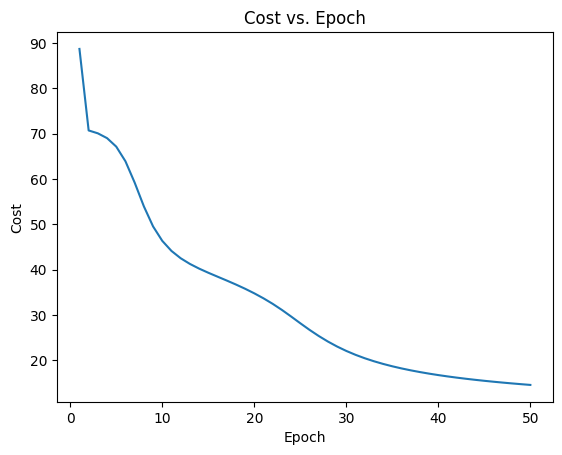

Predict[1, 1, 2, 0, 1, 1, 2, 2, 2, 2, 2, 1, 0, 0, 2, 0, 2, 0, 0, 2, 0, 0, 2, 2, 0, 2, 0, 2, 1, 0, 0, 0, 1, 2, 2, 1, 1, 2, 2, 2, 1, 0, 2, 1, 1, 1, 1, 0, 1, 1, 1, 0, 2, 0, 2, 0, 0, 0, 2, 2, 1, 1, 1, 1, 0, 2, 2, 1, 0, 0, 1, 0, 0, 1, 1, 0, 2, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 2, 1, 2, 0, 0, 1, 1, 2, 0, 1, 2, 1, 1, 2, 2, 2]
Correct Matches: 99
length: 105


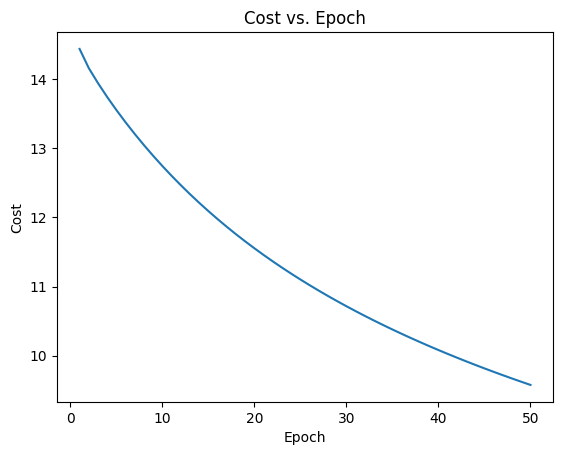

Predict[1, 1, 0, 1, 0, 1, 1, 0, 2, 2, 0, 0, 0, 2, 1, 1, 1, 2, 2, 2, 0, 1, 2, 1, 0, 2, 1, 2, 0, 2, 1, 0, 2, 2, 2, 0, 2, 0, 0, 2, 0, 1, 0, 2, 1, 1, 0, 2, 0, 1, 2, 1, 2, 0, 0, 1, 2, 2, 2, 0, 2, 1, 2, 1, 2, 0, 1, 1, 1, 0, 1, 0, 0, 2, 2, 2, 2, 1, 2, 2, 2, 1, 1, 1, 0, 2, 2, 1, 0, 1, 1, 2, 1, 0, 0, 1, 1, 2, 1, 1, 2, 2, 1, 2, 0]
Correct Matches: 100
length: 105
Scores: [94.28571428571428, 95.23809523809523]
Mean Accuracy: 94.762%


In [ ]:
# all
from random import random
from math import exp
import csv
from random import shuffle
import matplotlib.pyplot as plt


# Initialize a network
def initialize_network(n_inputs, n_hidden, n_outputs):
    network_lis = []
    hidden_layer = [{'weights': [random() for _ in range(n_inputs + 1)]} for _ in range(n_hidden)]
    network_lis.append(hidden_layer)
    output_layer = [{'weights': [random() for _ in range(n_hidden + 1)]} for _ in range(n_outputs)]
    network_lis.append(output_layer)
    return network_lis


def compute_z(weights, inputs):
    z = weights[-1]  # bias
    for i in range(len(weights) - 1):
        z += inputs[i] * weights[i]  # z= sum(x_i * weight_i) + bias
    return z


def sigmoid(z):
    return 1.0 / (1.0 + exp(-z))


def feedforward(weights, inputs):
    for layer in weights:  # go through each row of weights matrix which is the weights of each layer
        # print('****')
        # print(layer)
        # print('****')
        new_inputs = []  # the output of each layer is the input for next layer
        for node in layer:
            z = compute_z(node['weights'], inputs)  # based on the weight and input we want to compute the z
            a = sigmoid(z)
            node['output'] = a  # now each neurons has the output value
            new_inputs.append(a)  # new_inputs = [a_0, a_1, a_2,...] for each layer
        inputs = new_inputs
    return inputs  # the last layer input is the networks prediction


def backpropagation(network_weights, expected):
    for i in reversed(range(len(network_weights))):  # 1,0

        layer = network_weights[i]
        errors = []  # to hold local gradient for each layer

        if i == len(network_weights) - 1:  # for the last layer
            for j in range(len(layer)):  # to go through each neuron in this layer
                node = layer[j]
                errors.append(node['output'] - expected[j])  # a portion of delta is calculated
        else:  # for all hidden layers
            error = 0.0
            for j in range(len(layer)):
                for node in network_weights[i + 1]:  # neuron in the next layer
                    error += (node['weights'][j] * node[
                        'delta'])  # a portion of delta is calculated neuron['weight'][0] * neuron['delta']
                errors.append(error)

        for j in range(len(layer)):  # regardless of layer we need to calculate the delta
            node = layer[j]
            a = node['output']
            node['delta'] = errors[j] * (a * (1 - a))


def update_weights(network_weights, input_lis, le):
    for i in range(len(network_weights)):
        if i != 0:  # except for first layer, every layer uses its previous layer output
            input_lis = [neuron['output'] for neuron in network_weights[i - 1]]

        for node in network_weights[i]:  # going through every node in this layer
            for j in range(len(input_lis)):
                node['weights'][j] -= le * node['delta'] * input_lis[j]  # updating all the wights
            node['weights'][-1] -= le * node['delta']  # updating all the biases


def train_network(network_lis, dataset_lis, labels_set, learning_rate, epoch):
    costs = []  # List to store the cost for each epoch
    for epoch_num in range(epoch):
        cost = 0.0
        for row in dataset_lis:
            output = feedforward(network_lis, row)  # produces the output in the feedforward for instance ex:[0.0012375593654343202, 0.002058024513524419, 0.9982519894389591]
            target = [0] * len(labels_set)  # [0,0,0]
            target[row[-1]] = 1  # if label is 2 then target vector:[0,0,1]
            # print(f'row is {row}')
            # print(f'unique labels is {unique_labels}')
            # print(f'output is {output}')
            # print(f'target is {target}')
            cost += sum([(target[i] - output[i]) ** 2 for i in range(len(target))])  # calculated the error for this row
            backpropagation(network_lis, target)
            update_weights(network_lis, row[:-1], learning_rate)
        costs.append(cost)
        # print('>epoch=%d, lrate=%.3f, error=%.3f' % (epoch_num, learning_rate, cost)) #if you want to see changes in each epoch
    plt.plot(range(1, epoch + 1), costs)
    plt.xlabel('Epoch')
    plt.ylabel('Cost')
    plt.title('Cost vs. Epoch')
    plt.show()

def predict(network_lis, data):  # this data doesnt have the label only inputs
    outputs = feedforward(network_lis, data)
    return outputs.index(max(outputs))  # finds the max in the output and report the index of that as for the label


def load_data(file_path):
    dataset_lis = []
    with open(file_path) as f:
        reader = csv.reader(f)
        for row in reader:
            dataset_lis.append(row)
    return dataset_lis


dataset = load_data('/content/wheat-seeds.csv')


# print(type(dataset[0][0]))  # <class 'str'>
# print(type(dataset[0][-1]))  # <class 'str'>

def label_convert(unique_labels_lis, label):  # for label conversion we use a lookup table ex {'1':0, '2':1, '3':2}
    lookup = {}
    for i, value in enumerate(unique_labels_lis):
        lookup[value] = i
    return lookup[label]


# we need to convert the types for inputs to float and the label to int starting at 0
def dataset_convert(dataset_lis):
    unique_labels = list(set([row[-1] for row in dataset]))
    for row in dataset_lis:
        row[:-1] = [float(item) for item in row[:-1]]
        row[-1] = label_convert(unique_labels, row[-1])


print(f'dataset before convert {dataset[100]}')
dataset_convert(dataset)
# print(type(dataset[0][0]))  # <class 'float'>
# print(type(dataset[0][-1]))  # <class 'int'>
print(f'dataset after convert {dataset[100]}')


# print a row of the dataset before normalization
# print(dataset[0])  # [15.26, 14.84, 0.871, 5.763, 3.312, 2.221, 5.22, 1]


def normalize_dataset(dataset):
    # Convert data types
    dataset_convert(dataset)

    # Get mins and maxes across entire dataset
    mins = [min(feature[:-1]) for feature in
            zip(*dataset)]  # mins of each column [10.59, 12.41, 0.8081, 4.899, 2.63, 0.7651, 4.519, 1]
    maxs = [max(feature[:-1]) for feature in
            zip(*dataset)]  # max of each column [21.18, 17.25, 0.9183, 6.675, 4.033, 8.456, 6.55, 3]
    print(f'mins list is {mins}')
    print(maxs)

    for row in dataset:
        for j in range(len(row) - 1):
            row[j] = (row[j] - mins[j]) / (maxs[j] - mins[j])

    return dataset


dataset = normalize_dataset(dataset)  # update the dataset to normalized version
# print(dataset[0])  # [0.4409820585457979, 0.5020661157024793, 0.570780399274047, 0.48648648648648646,0.48610121168923714, 0.18930164220052273, 0.3451501723289019, 1]

print(f'dataset after normalization {dataset[100]}')


def cross_validation(dataset_lis, k_fold):
    num_samples = len(dataset_lis)
    fold_size = num_samples // k_fold
    shuffle(dataset_lis)  # for adding randomness

    folds = [dataset_lis[i:i + fold_size] for i in range(0, num_samples, fold_size)]  # Split dataset into folds
    train_data = []
    test_data = []

    for i in range(k_fold):
        test_data.append(folds[i])  # [dataset[0:70] , dataset[70:140] , dataset[140:210]]
        train_data_fold = [sample for j, fold in enumerate(folds) if j != i for sample in
                           fold]  # [dataset[70:210] , dataset[0:70]dataset[140:210] , dataset[0:70]dataset[70:210]]
        train_data.append(train_data_fold)

    return train_data, test_data


def accuracy(predict_lis,
             test_labels_lis):  # give the function what we wanted and what we calculated, each a list of all
    # predictions and labels
    correct_matches = 0

    # Iterate through both lists simultaneously
    for pred, label in zip(predict_lis, test_labels_lis):
        # print(f'Predict  {type(pred)}')
        # print(f'label  {type(label)}')
        if pred == label:  # If the predicted value matches the label
            correct_matches += 1  # Increment the counter

    print("Correct Matches:", correct_matches)
    print("length:", len(test_labels_lis))
    return (correct_matches / len(test_labels_lis)) * 100.0


def evaluate(dataset_lis, network_weights, labels, k_folds, learning_rate, epoch):
    scores_lis = []
    for i in range(k_folds):
        train, test = cross_validation(dataset_lis, k_folds)
        train_network(network_lis=network_weights, dataset_lis=train[i], labels_set=labels,
                      learning_rate=learning_rate, epoch=epoch)
        predicts = [predict(network_weights, row) for row in test[i]]  # [0,0,0,1,3,2,....]
        print(f'Predict{predicts}')
        test_labels = [row[-1] for row in test[i]]
        # print(f'test_labels{test_labels}')
        scores_lis.append(accuracy(test_labels, predicts))
    return scores_lis


num_hidden = 5  # number
num_inputs = len(dataset[0]) - 1  # inputs of the model which is our features/labels/columns
unique_labels = list(set([row[-1] for row in dataset]))
num_outputs = len(unique_labels)
network = initialize_network(num_inputs, num_hidden, num_outputs)
scores = evaluate(dataset, network, unique_labels, k_folds=2, learning_rate=0.3, epoch=50)
mean_acc = (sum(scores) / len(scores)) * 100
print('Scores: %s' % scores)
print('Mean Accuracy: %.3f%%' % (sum(scores) / float(len(scores))))


# **Vanishing Gradient**

In the context of training neural networks using gradient descent optimization algorithms, it was traditionally believed that the activation function used in the network needed to be differentiable. This is because gradient descent relies on calculating derivatives of the loss function with respect to the network parameters (weights and biases) to update them iteratively during training.

A differentiable function is one that has a derivative at every point within its domain, meaning you can calculate the rate of change (slope) of the function at any given input. This is crucial for gradient-based optimization methods because they involve computing gradients (derivatives) of the loss function with respect to the model parameters.

Historically, this belief led to the convention of using activation functions like the sigmoid function (logistic function) or hyperbolic tangent function (tanh) in neural networks. Both of these functions are differentiable across their domains, making them suitable for gradient-based optimization.

However, with advancements in deep learning research, it has been demonstrated that non-differentiable activation functions, such as the rectified linear unit (ReLU) and its variants, can also be effectively used in neural networks. These functions offer advantages like faster training convergence and mitigating the vanishing gradient problem, despite not being differentiable at all points. Therefore, while differentiability remains an important consideration, it's now understood that it's not an absolute requirement for activation functions in neural networks.

 a very good link to see different optimizations https://imgur.com/a/Hqolp

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer RandomNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


Epoch 1/100
4/4 [==============================] - 2s 96ms/step - loss: 0.7048 - accuracy: 0.3571 - val_loss: 0.7186 - val_accuracy: 0.2500
Epoch 2/100
4/4 [==============================] - 0s 19ms/step - loss: 0.6987 - accuracy: 0.3571 - val_loss: 0.7142 - val_accuracy: 0.2500
Epoch 3/100
4/4 [==============================] - 0s 21ms/step - loss: 0.6948 - accuracy: 0.3571 - val_loss: 0.7110 - val_accuracy: 0.2500
Epoch 4/100
4/4 [==============================] - 0s 16ms/step - loss: 0.6913 - accuracy: 0.3571 - val_loss: 0.7080 - val_accuracy: 0.2500
Epoch 5/100
4/4 [==============================] - 0s 15ms/step - loss: 0.6885 - accuracy: 0.3571 - val_loss: 0.7055 - val_accuracy: 0.2500
Epoch 6/100
4/4 [==============================] - 0s 21ms/step - loss: 0.6857 - accuracy: 0.3571 - val_loss: 0.7030 - val_accuracy: 0.2500
Epoch 7/100
4/4 [==============================] - 0s 15ms/step - loss: 0.6832 - accuracy: 0.3571 - val_loss: 0.7005 - val_accuracy: 0.2500
Epoch 8/100
4/4 [===

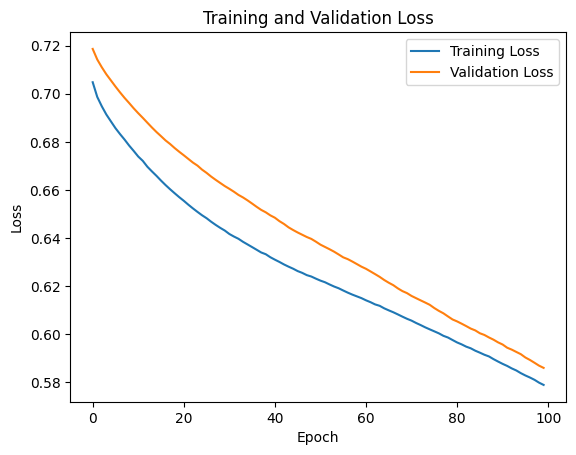

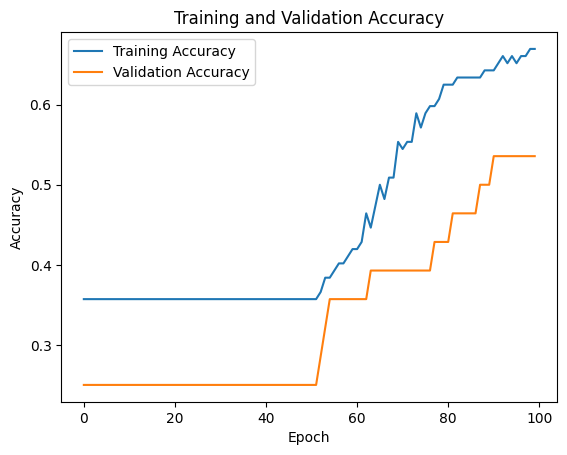

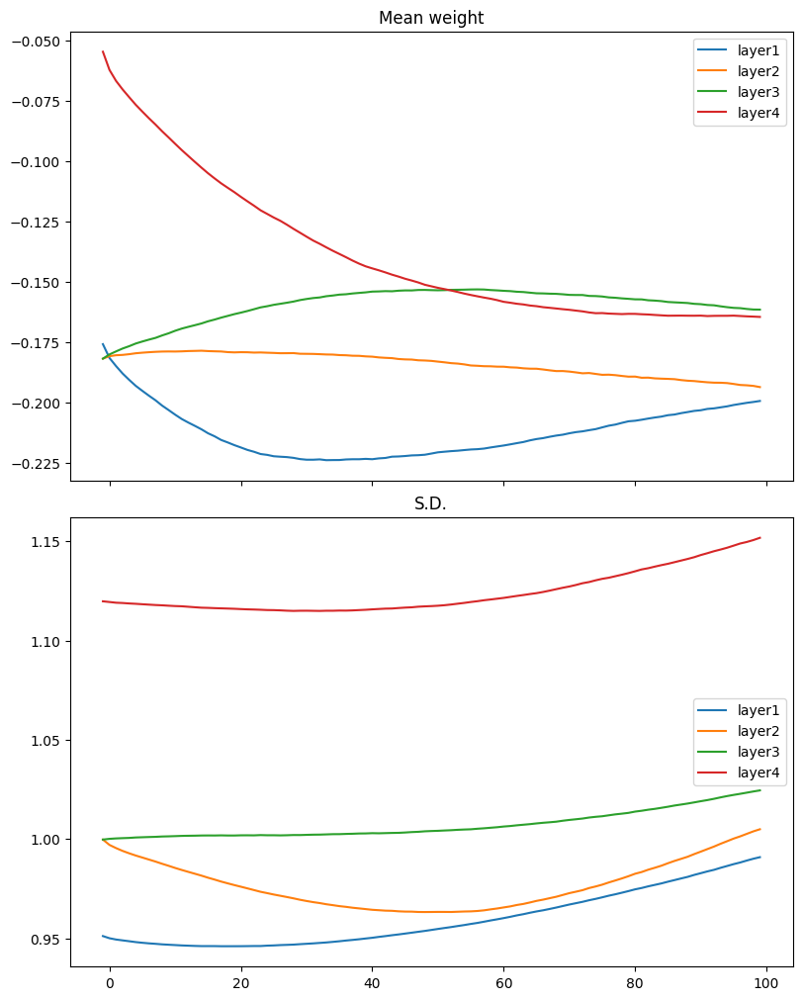

In [ ]:
#same code with keras API
import numpy as np
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.initializers import RandomNormal
from tensorflow.keras.callbacks import Callback
import matplotlib.pyplot as plt
import csv


def load_data(file_path):
    dataset_lis = []
    with open(file_path) as f:
        reader = csv.reader(f)
        for row in reader:
            dataset_lis.append(row)
    return dataset_lis

initializer = RandomNormal(mean=0.0, stddev=1.0) #Initializer that generates tensors with a normal distribution.

dataset = load_data('/content/wheat-seeds.csv')
#convert the dataset
def label_convert(unique_labels_lis, label):  # for label conversion we use a lookup table ex {'1':0, '2':1, '3':2}
    lookup = {}
    for i, value in enumerate(unique_labels_lis):
        lookup[value] = i
    return lookup[label]


# we need to convert the types for inputs to float and the label to int starting at 0
def dataset_convert(dataset_lis):
    unique_labels = list(set([row[-1] for row in dataset]))
    for row in dataset_lis:
        row[:-1] = [float(item) for item in row[:-1]]
        row[-1] = label_convert(unique_labels, row[-1])

#normalize dataset
def normalize_dataset(dataset):
    # Convert data types
    dataset_convert(dataset)

    # Get mins and maxes across entire dataset
    mins = [min(feature[:-1]) for feature in
            zip(*dataset)]  # mins of each column [10.59, 12.41, 0.8081, 4.899, 2.63, 0.7651, 4.519, 1]
    maxs = [max(feature[:-1]) for feature in
            zip(*dataset)]  # max of each column [21.18, 17.25, 0.9183, 6.675, 4.033, 8.456, 6.55, 3]

    for row in dataset:
        for j in range(len(row) - 1):
            row[j] = (row[j] - mins[j]) / (maxs[j] - mins[j])
    return dataset

dataset = normalize_dataset(dataset)
dataset = np.array(dataset)

# Split features and labels
X = dataset[:, :-1]
y = dataset[:, -1]

num_outputs = len(set(y))

y_onehot = np.zeros((len(y), num_outputs))
for i in range(len(y)):
  y_onehot[i, int(y[i])] = 1

X_train, X_test, y_train, y_test = train_test_split(X, y_onehot, test_size=0.33, random_state=42)

# watching the weights
class WeightWatch(Callback):
  '''this class inherits from Callback class we intend to use the on_epoch_end method to look into the weights in each epoch'''
  def __init__(self, model):
     super().__init__()
     self.model = model
     self.weights = []
     self.epochs = []

  def on_epoch_end(self, epoch, logs = None):
    '''This method is called by Keras at the end of each training epoch. Inside this method, the weights of each layer are captured.'''
    self.epochs.append(epoch) #The current epoch number is appended to the epochs list.
    weight = {}
    for layer in model.layers: #For each layer in the model,
      if not layer.weights: #if the layer has weights (trainable parameters)
        continue
      name = layer.weights[0].name.split("/")[0] #its name and weights are extracted and stored in a dictionary weight.
      weight[name] = layer.weights[0].numpy()
    self.weights.append(weight) #The dictionary weight is then appended to the weights list.

# Define the model architecture
num_hidden = 5  # number of nodes in first hidden layer
num_inputs = len(X_train[0])
model = Sequential([
    Dense(num_hidden, kernel_initializer=initializer, activation='sigmoid', input_shape=(num_inputs,), name = 'layer1'),
    Dense(6, kernel_initializer=initializer, activation='sigmoid', name = 'layer2'),
    Dense(5, kernel_initializer=initializer, activation='sigmoid', name = 'layer3'),
    Dense(num_outputs, kernel_initializer=initializer, activation='sigmoid', name = 'layer4')
])

capture_cb = WeightWatch(model) #an instance of WeightWatch class to capture the weights of each layer of the model after each epoch
capture_cb.on_epoch_end(-1)


# Compile the model
#optimizer is root mean squared propagation, it is a variant of stochastic gradient descent (SGD) that adapts the learning rate separately for each parameter.
# model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.compile(optimizer="rmsprop", loss="binary_crossentropy", metrics=['accuracy'])
# Train the model
history = model.fit(X_train, y_train, batch_size=32, epochs=100, verbose=1, validation_split=0.2, callbacks=[capture_cb])

# Evaluate the model
loss, accuracy = model.evaluate(X_test, y_test)
# print("Test Loss:", loss)
# print("Test Accuracy:", accuracy)

# Plot training loss
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

# Plot training accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()
plt.show()

def plotweight(capture_cb):
    "Plot the weights' mean and s.d. across epochs"
    # The x-axis represents the epochs, and the y-axis represents the mean or standard deviation of weights.
    fig, ax = plt.subplots(2, 1, sharex=True, constrained_layout=True, figsize=(8, 10))  #a figure with two subplots, sharing the x-axis.
    ax[0].set_title("Mean weight") #In the first subplot, it plots the mean weight values for each weight parameter across epochs.
    for key in capture_cb.weights[0]:
        ax[0].plot(capture_cb.epochs, [w[key].mean() for w in capture_cb.weights], label=key)
    ax[0].legend()
    ax[1].set_title("S.D.") #it plots the standard deviation (s.d.) of weight values for each weight parameter across epochs.
    for key in capture_cb.weights[0]:
        ax[1].plot(capture_cb.epochs, [w[key].std() for w in capture_cb.weights], label=key)
    ax[1].legend()
    plt.show()

plotweight(capture_cb)